In [1]:
import numpy as np
import matplotlib.pyplot as plt

from scipy.special import jn

from pathlib import Path

from joblib import load

from scipy.ndimage import gaussian_filter

L=32

J=1.0
U=10.0
V=5.0

A_vals=[0.0, 0.5, 1.0, 1.5, 2.0, 3.0]
w_vals=[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 8.0]

filling=[0.5, 1.0]

k = np.linspace(-np.pi, np.pi, L)
l = np.arange(L)
phase_factor = np.exp(-1j * np.outer(k, l)) / np.sqrt(L)

home_dir = Path.cwd()

In [2]:
renormalization_dir = home_dir / "renormalization"

nk_U = []

for n in filling:
    for A in A_vals:
        for w in w_vals:

            results_dir = home_dir / "renormalization" / f"results_L{L}_U{U}_A{A}_w{w}_n{n}"

            if results_dir.exists():

                print(f"Loading data for U={U}, A={A}, Ω={w}, n={n}")

                omega_dir = results_dir / "omegas"

                omega_files = sorted(omega_dir.glob("omega_*.npy"), key=lambda p: int(p.stem.split("_")[1]))
                omega_slices = [np.load(f) for f in omega_files]
                omega = np.concatenate(omega_slices)

                print()
                print(f"-> ω_i={omega[0]}, ω_f={omega[-1]}, N_omega={len(omega)}")

                corr_slices = []

                for idx in range(len(omega_files)):
                    
                    corr_file = results_dir / "correlations" / f"correlation-low_{idx}.npy"
                    
                    if corr_file.exists():
                    
                        corr_slice = load(corr_file)

                        corr_slices.append(corr_slice)

                corr = np.concatenate(corr_slices)

                N_omega, N_t, L, L = corr.shape

                print(f"-> Correlation shape: (N_omega, N_t, L, L)={corr.shape}")

                nk = np.zeros((N_omega, N_t, L), dtype=np.float64)

                for wi in range(N_omega):
                    for ti in range(N_t):

                        nk[wi, ti, :] = np.real(np.diag(
                                            phase_factor @ corr[wi, ti, :, :] @ np.conj(phase_factor).T
                                        ))

                nk_U.append({
                    "V": V,
                    "A": A,
                    "w": w,
                    "omega": omega,
                    "nk": nk
                })

                print(f"-> nk Shape (N_omega, N_t, L) = {nk.shape}")
                print()
                print("="*50)

Loading data for U=10.0, A=0.0, Ω=1.0, n=1.0

-> ω_i=-10.0, ω_f=10.0, N_omega=100
-> Correlation shape: (N_omega, N_t, L, L)=(100, 200, 32, 32)
-> nk Shape (N_omega, N_t, L) = (100, 200, 32)

Loading data for U=10.0, A=1.0, Ω=1.0, n=1.0

-> ω_i=-10.0, ω_f=10.0, N_omega=100
-> Correlation shape: (N_omega, N_t, L, L)=(100, 200, 32, 32)
-> nk Shape (N_omega, N_t, L) = (100, 200, 32)

Loading data for U=10.0, A=1.5, Ω=1.0, n=1.0

-> ω_i=-10.0, ω_f=10.0, N_omega=100
-> Correlation shape: (N_omega, N_t, L, L)=(100, 200, 32, 32)
-> nk Shape (N_omega, N_t, L) = (100, 200, 32)

Loading data for U=10.0, A=1.5, Ω=2.0, n=1.0

-> ω_i=-10.0, ω_f=10.0, N_omega=100
-> Correlation shape: (N_omega, N_t, L, L)=(100, 200, 32, 32)
-> nk Shape (N_omega, N_t, L) = (100, 200, 32)

Loading data for U=10.0, A=3.0, Ω=2.0, n=1.0

-> ω_i=-10.0, ω_f=10.0, N_omega=100
-> Correlation shape: (N_omega, N_t, L, L)=(100, 200, 32, 32)
-> nk Shape (N_omega, N_t, L) = (100, 200, 32)



In [3]:
in_gap_dir = home_dir / "in-gap"

nk_V = []

for n in filling:
    for A in A_vals:
        for w in w_vals:

            results_dir = home_dir / "in-gap" / f"results_L{L}_V{V}_A{A}_w{w}_n{n}"

            if results_dir.exists():

                print(f"Loading data for V={V}, A={A}, Ω={w}, n={n}")

                omega_dir = results_dir / "omegas"

                omega_files = sorted(omega_dir.glob("omega_*.npy"), key=lambda p: int(p.stem.split("_")[1]))
                omega_slices = [np.load(f) for f in omega_files]
                omega = np.concatenate(omega_slices)

                print()
                print(f"-> ω_i={omega[0]}, ω_f={omega[-1]}, N_omega={len(omega)}")

                corr_slices = []

                for idx in range(len(omega_files)):
                    
                    corr_file = results_dir / "correlations" / f"correlation-low_{idx}.npy"
                    
                    if corr_file.exists():
                    
                        corr_slice = load(corr_file)

                        corr_slices.append(corr_slice)

                corr = np.concatenate(corr_slices)

                N_omega, N_t, L, L = corr.shape

                print(f"-> Correlation shape: (N_omega, N_t, L, L)={corr.shape}")

                nk = np.zeros((N_omega, N_t, L), dtype=np.float64)

                for wi in range(N_omega):
                    for ti in range(N_t):

                        nk[wi, ti, :] = np.real(np.diag(
                                            phase_factor @ corr[wi, ti, :, :] @ np.conj(phase_factor).T
                                        ))

                nk_V.append({
                    "U": U,
                    "A": A,
                    "w": w,
                    "omega": omega,
                    "nk": nk
                })

                print(f"-> nk Shape (N_omega, N_t, L) = {nk.shape}")
                print()
                print("="*50)

Loading data for V=5.0, A=0.0, Ω=0.0, n=0.5

-> ω_i=-10.0, ω_f=10.0, N_omega=200
-> Correlation shape: (N_omega, N_t, L, L)=(200, 300, 32, 32)
-> nk Shape (N_omega, N_t, L) = (200, 300, 32)

Loading data for V=5.0, A=1.5, Ω=1.0, n=0.5

-> ω_i=-10.0, ω_f=10.0, N_omega=200
-> Correlation shape: (N_omega, N_t, L, L)=(200, 300, 32, 32)
-> nk Shape (N_omega, N_t, L) = (200, 300, 32)

Loading data for V=5.0, A=1.5, Ω=4.0, n=0.5

-> ω_i=-10.0, ω_f=10.0, N_omega=200
-> Correlation shape: (N_omega, N_t, L, L)=(200, 300, 32, 32)
-> nk Shape (N_omega, N_t, L) = (200, 300, 32)

Loading data for V=5.0, A=1.5, Ω=5.0, n=0.5

-> ω_i=-10.0, ω_f=10.0, N_omega=200
-> Correlation shape: (N_omega, N_t, L, L)=(200, 300, 32, 32)
-> nk Shape (N_omega, N_t, L) = (200, 300, 32)

Loading data for V=5.0, A=1.5, Ω=8.0, n=0.5

-> ω_i=-10.0, ω_f=10.0, N_omega=200
-> Correlation shape: (N_omega, N_t, L, L)=(200, 300, 32, 32)
-> nk Shape (N_omega, N_t, L) = (200, 300, 32)



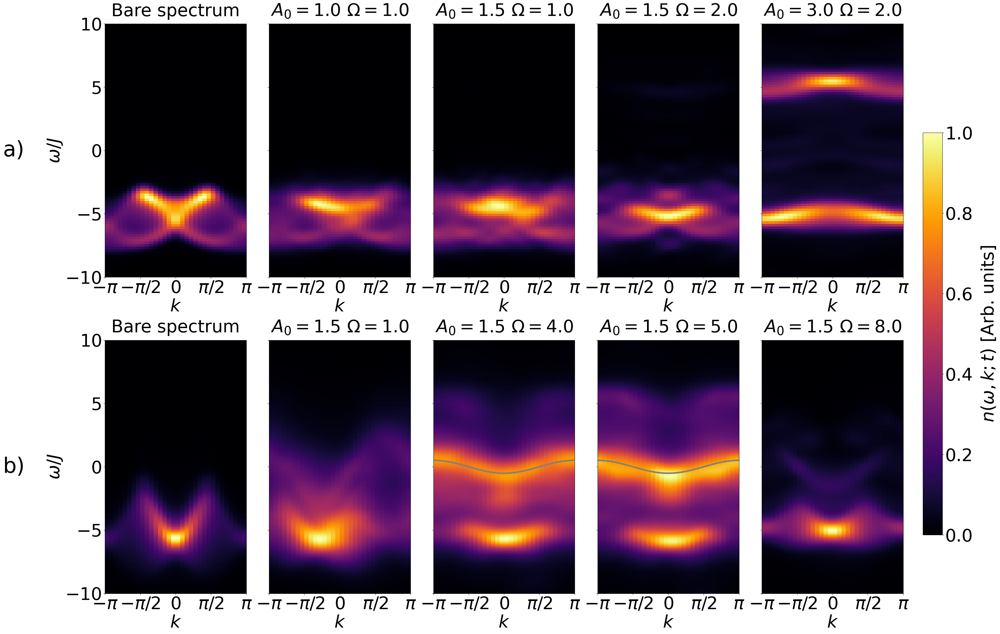

In [4]:
# Each spectrum (omega vs k), one panel per dataset, arranged in a 2x6 grid:
# first row -> nk_U (renormalization), second row -> nk_V (in-gap).

ti    = 137                       # final time slice
sigma = (1.0, 1.0)               # (omega, k) smoothing for the 2D spectrum
colors = ['red', 'orange', 'blue']
row_labels = ['a)', 'b)']

# ---- pick the datasets up front ----------------------------------------
# The bare spectrum (A = 0) is w-independent, so include it regardless of
# other datasets and place it first. Then all the driven datasets.
def select_datasets(nk_list):
    bare   = [d for d in nk_list if np.isclose(d['A'], 0.0)]
    driven = [d for d in nk_list if not np.isclose(d['A'], 0.0)]
    return bare[:1] + driven      # bare[:1] -> just one bare panel

selected_U = select_datasets(nk_U)
selected_V = select_datasets(nk_V)

# ---- 2x6 grid: row 0 = nk_U, row 1 = nk_V --------------------------------
n_row, n_col = 2, 5
if len(selected_U) > n_col or len(selected_V) > n_col:
    raise ValueError(f'Selected datasets exceed grid width of {n_col}')

fig, axes = plt.subplots(
    n_row, n_col,
    figsize=(7 * n_col, 12 * n_row),
    sharey='row',
)
axes = np.atleast_2d(axes)

im = None
for row, selected in enumerate([selected_U, selected_V]):
    for i, dset in enumerate(selected):
        A     = dset['A']
        w     = dset['w']
        omega = dset['omega']

        ax_spectrum = axes[row, i]        # 2D spectrum

        # ---- 2D spectrum ----
        frame = gaussian_filter(dset['nk'][:, ti, :], sigma=sigma, mode='nearest')
        frame = frame / np.max(frame)

        im = ax_spectrum.imshow(
            frame, aspect='auto', origin='lower',
            extent=[k[0] / np.pi, k[-1] / np.pi, omega[0], omega[-1]],
            cmap='inferno', vmin=0.0, vmax=1.0,
        )

        if A == 0.0:
            ax_spectrum.set_title('Bare spectrum', fontsize=45, pad=20)
        elif A == 1.5 and w == 4.0 or A == 1.5 and w == 5.0:
            J_eff = J * jn(0, A) 
            ax_spectrum.set_title(rf'$A_0={A}\ \Omega={w}$', fontsize=45, pad=20)
            ax_spectrum.plot(k / np.pi, -J_eff * np.cos(k), color='gray', linewidth=4, linestyle='-')
        else:
            ax_spectrum.set_title(rf'$A_0={A}\ \Omega={w}$', fontsize=45, pad=20)

        ax_spectrum.set_xlabel(r'$k$', fontsize=45)
        ax_spectrum.set_xticks([-1, -0.5, 0, 0.5, 1])
        ax_spectrum.set_xticklabels([r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$'])
        ax_spectrum.tick_params(labelsize=45)

        # y (omega) label only on the leftmost column
        if i == 0:
            ax_spectrum.set_ylabel(r'$\omega / J$', fontsize=45)
            ax_spectrum.set_yticks(np.arange(omega[0], omega[-1] + 1, 5))

    # hide any unused axes in this row (grid wider than the datasets selected)
    for j in range(len(selected), n_col):
        axes[row, j].axis('off')

fig.tight_layout(rect=[0.03, 0, 0.92, 0.95])

# panel labels (a), b)) to the left of each row, vertically centered on it
for row, label in enumerate(row_labels):
    pos = axes[row, 0].get_position()
    fig.text(-0.01, (pos.y0 + pos.y1) / 2, label, fontsize=55,
              ha='left', va='center')

cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.6])  # (left, bottom, width, height)
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'$n(\omega, k; t)$ [Arb. units]', fontsize=45, labelpad=20)
cbar.ax.tick_params(labelsize=45)

plt.show()

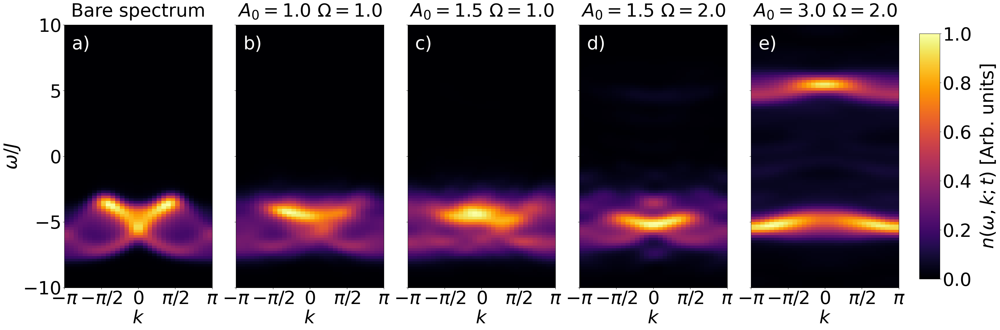

In [6]:
# Same style/settings as the combined plot above, but nk_U (renormalization) only.

panel_labels = ['a)', 'b)', 'c)', 'd)', 'e)']

selected_U = select_datasets(nk_U)

n_row, n_col = 1, 5
if len(selected_U) > n_col:
    raise ValueError(f'Selected datasets exceed grid width of {n_col}')

fig, axes = plt.subplots(
    n_row, n_col,
    figsize=(7 * n_col, 12 * n_row),
    sharey='row',
)
axes = np.atleast_2d(axes)

im = None
for i, dset in enumerate(selected_U):
    A     = dset['A']
    w     = dset['w']
    omega = dset['omega']

    ax_spectrum = axes[0, i]

    frame = gaussian_filter(dset['nk'][:, ti, :], sigma=sigma, mode='nearest')
    frame = frame / np.max(frame)

    im = ax_spectrum.imshow(
        frame, aspect='auto', origin='lower',
        extent=[k[0] / np.pi, k[-1] / np.pi, omega[0], omega[-1]],
        cmap='inferno', vmin=0.0, vmax=1.0,
    )

    ax_spectrum.text(
        0.05, 0.96, panel_labels[i], transform=ax_spectrum.transAxes,
        fontsize=45, color='white', ha='left', va='top'
    )

    if A == 0.0:
        ax_spectrum.set_title('Bare spectrum', fontsize=45, pad=20)
    elif A == 1.5 and w == 4.0 or A == 1.5 and w == 5.0:
        J_eff = J * jn(0, A)
        ax_spectrum.set_title(rf'$A_0={A}\ \Omega={w}$', fontsize=45, pad=20)
        ax_spectrum.plot(k / np.pi, -J_eff * np.cos(k), color='gray', linewidth=4, linestyle='-')
    else:
        ax_spectrum.set_title(rf'$A_0={A}\ \Omega={w}$', fontsize=45, pad=20)

    ax_spectrum.set_xlabel(r'$k$', fontsize=45)
    ax_spectrum.set_xticks([-1, -0.5, 0, 0.5, 1])
    ax_spectrum.set_xticklabels([r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$'])
    ax_spectrum.tick_params(labelsize=45)

    if i == 0:
        ax_spectrum.set_ylabel(r'$\omega / J$', fontsize=45)
        ax_spectrum.set_yticks(np.arange(omega[0], omega[-1] + 1, 5))

for j in range(len(selected_U), n_col):
    axes[0, j].axis('off')

fig.tight_layout(rect=[0.03, 0, 0.92, 0.95])

cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.7]) # (left, bottom, width, height)
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'$n(\omega, k; t)$ [Arb. units]', fontsize=45, labelpad=20)
cbar.ax.tick_params(labelsize=45)

plt.show()

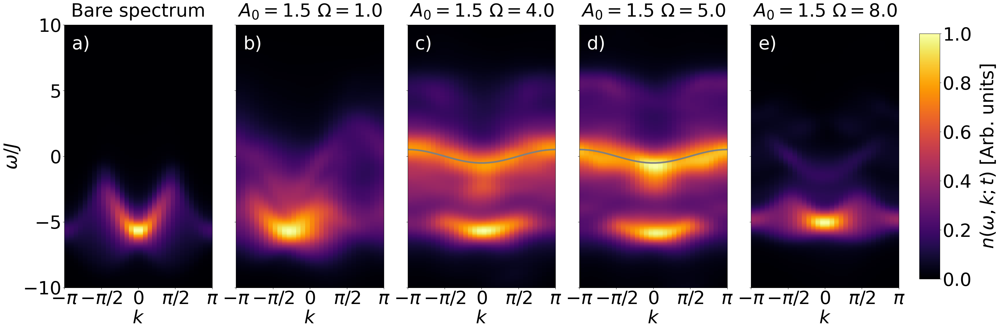

In [7]:
# Same style/settings as the combined plot above, but nk_V (in-gap) only.

panel_labels = ['a)', 'b)', 'c)', 'd)', 'e)']

selected_V = select_datasets(nk_V)

n_row, n_col = 1, 5
if len(selected_V) > n_col:
    raise ValueError(f'Selected datasets exceed grid width of {n_col}')

fig, axes = plt.subplots(
    n_row, n_col,
    figsize=(7 * n_col, 12 * n_row),
    sharey='row',
)
axes = np.atleast_2d(axes)

im = None
for i, dset in enumerate(selected_V):
    A     = dset['A']
    w     = dset['w']
    omega = dset['omega']

    ax_spectrum = axes[0, i]

    frame = gaussian_filter(dset['nk'][:, ti, :], sigma=sigma, mode='nearest')
    frame = frame / np.max(frame)

    im = ax_spectrum.imshow(
        frame, aspect='auto', origin='lower',
        extent=[k[0] / np.pi, k[-1] / np.pi, omega[0], omega[-1]],
        cmap='inferno', vmin=0.0, vmax=1.0,
    )

    ax_spectrum.text(
        0.05, 0.96, panel_labels[i], transform=ax_spectrum.transAxes,
        fontsize=45, color='white', ha='left', va='top'
    )

    if A == 0.0:
        ax_spectrum.set_title('Bare spectrum', fontsize=45, pad=20)
    elif A == 1.5 and w == 4.0 or A == 1.5 and w == 5.0:
        J_eff = J * jn(0, A)
        ax_spectrum.set_title(rf'$A_0={A}\ \Omega={w}$', fontsize=45, pad=20)
        ax_spectrum.plot(k / np.pi, -J_eff * np.cos(k), color='gray', linewidth=4, linestyle='-')
    else:
        ax_spectrum.set_title(rf'$A_0={A}\ \Omega={w}$', fontsize=45, pad=20)

    ax_spectrum.set_xlabel(r'$k$', fontsize=45)
    ax_spectrum.set_xticks([-1, -0.5, 0, 0.5, 1])
    ax_spectrum.set_xticklabels([r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$'])
    ax_spectrum.tick_params(labelsize=45)

    if i == 0:
        ax_spectrum.set_ylabel(r'$\omega / J$', fontsize=45)
        ax_spectrum.set_yticks(np.arange(omega[0], omega[-1] + 1, 5))

for j in range(len(selected_V), n_col):
    axes[0, j].axis('off')

fig.tight_layout(rect=[0.03, 0, 0.92, 0.95])

cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'$n(\omega, k; t)$ [Arb. units]', fontsize=45, labelpad=20)
cbar.ax.tick_params(labelsize=45)

plt.show()

In [9]:
# Animate the time evolution of the plot above (nk_V spectra), sweeping over
# the time index instead of fixing ti.

import matplotlib.animation as animation
from IPython.display import HTML

frame_step = 5  # use every 2nd time slice to keep the animation lighter
N_t_anim = min(dset['nk'].shape[1] for dset in selected_V)
frame_indices = range(0, N_t_anim, frame_step)

fig, axes = plt.subplots(
    n_row, n_col,
    figsize=(7 * n_col, 12 * n_row),
    sharey='row',
)
axes = np.atleast_2d(axes)

ims = []
for i, dset in enumerate(selected_V):
    A     = dset['A']
    w     = dset['w']
    omega = dset['omega']

    ax_spectrum = axes[0, i]

    frame = gaussian_filter(dset['nk'][:, 0, :], sigma=sigma, mode='nearest')
    frame = frame / np.max(frame)

    im = ax_spectrum.imshow(
        frame, aspect='auto', origin='lower',
        extent=[k[0] / np.pi, k[-1] / np.pi, omega[0], omega[-1]],
        cmap='inferno', vmin=0.0, vmax=1.0,
    )
    ims.append(im)

    ax_spectrum.text(
        0.05, 0.96, panel_labels[i], transform=ax_spectrum.transAxes,
        fontsize=45, color='white', ha='left', va='top'
    )

    if A == 0.0:
        ax_spectrum.set_title('Bare spectrum', fontsize=45, pad=20)
    elif A == 1.5 and w == 4.0 or A == 1.5 and w == 5.0:
        J_eff = J * jn(0, A)
        ax_spectrum.set_title(rf'$A_0={A}\ \Omega={w}$', fontsize=45, pad=20)
        ax_spectrum.plot(k / np.pi, -J_eff * np.cos(k), color='gray', linewidth=4, linestyle='-')
    else:
        ax_spectrum.set_title(rf'$A_0={A}\ \Omega={w}$', fontsize=45, pad=20)

    ax_spectrum.set_xlabel(r'$k$', fontsize=45)
    ax_spectrum.set_xticks([-1, -0.5, 0, 0.5, 1])
    ax_spectrum.set_xticklabels([r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$'])
    ax_spectrum.tick_params(labelsize=45)

    if i == 0:
        ax_spectrum.set_ylabel(r'$\omega / J$', fontsize=45)
        ax_spectrum.set_yticks(np.arange(omega[0], omega[-1] + 1, 5))

for j in range(len(selected_V), n_col):
    axes[0, j].axis('off')

fig.tight_layout(rect=[0.03, 0, 0.92, 0.95])

cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.7])
cbar = fig.colorbar(ims[0], cax=cbar_ax)
cbar.set_label(r'$n(\omega, k; t)$ [Arb. units]', fontsize=45, labelpad=20)
cbar.ax.tick_params(labelsize=45)

time_text = fig.suptitle('t index = 0', fontsize=50, y=0.99)

def update(t_idx):
    for im, dset in zip(ims, selected_V):
        frame = gaussian_filter(dset['nk'][:, t_idx, :], sigma=sigma, mode='nearest')
        frame = frame / np.max(frame)
        im.set_data(frame)
    time_text.set_text(f't index = {t_idx}')
    return ims + [time_text]

anim = animation.FuncAnimation(
    fig, update, frames=frame_indices, interval=100, blit=False,
)

plt.close(fig)  # avoid showing a duplicate static figure

anim.save(home_dir / 'in_gap_spectrum_evolution.gif', writer='pillow', fps=10)

HTML(anim.to_jshtml())